In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

In [2]:
truth = pd.read_parquet('../22011/truth_1.parquet')
data =  pd.read_parquet('../22011/1/PMTfied_1.parquet')
vars = data.columns

In [3]:
data.info()
#print nulls


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1472807 entries, 0 to 1472806
Data columns (total 34 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   event_no           1472807 non-null  int64  
 1   original_event_no  1472807 non-null  int32  
 2   dom_x              1472807 non-null  float32
 3   dom_y              1472807 non-null  float32
 4   dom_z              1472807 non-null  float32
 5   dom_x_rel          1472807 non-null  float32
 6   dom_y_rel          1472807 non-null  float32
 7   dom_z_rel          1472807 non-null  float32
 8   pmt_area           1472807 non-null  float32
 9   rde                1472807 non-null  float32
 10  saturation_status  1472807 non-null  int32  
 11  bad_dom_status     1472807 non-null  int32  
 12  bright_dom_status  1472807 non-null  int32  
 13  q1                 1472807 non-null  float32
 14  q2                 1472807 non-null  float32
 15  q3                 1472807 non-n

In [4]:
print(data.shape)

(1472807, 34)


In [5]:
# print first 5 rows
print(data[1:500])
print(data.columns)

            event_no  original_event_no       dom_x       dom_y       dom_z  \
1    111000100000000                  0  326.850006 -209.070007 -437.720001   
2    111000100000000                  0  326.850006 -209.070007 -505.799988   
3    111000100000000                  0  443.779999 -194.339996 -368.399994   
4    111000100000000                  0  443.959991 -194.490005 -451.510010   
5    111000100000000                  0  444.049988 -194.460007 -487.549988   
..               ...                ...         ...         ...         ...   
495  111000100000010                 10   -9.680000  -79.500000 -212.479996   
496  111000100000010                 10   -9.680000  -79.500000 -219.490005   
497  111000100000010                 10   -9.680000  -79.500000 -226.500000   
498  111000100000010                 10   -9.680000  -79.500000 -240.509995   
499  111000100000010                 10   -9.680000  -79.500000 -247.520004   

      dom_x_rel   dom_y_rel  dom_z_rel  pmt_area   

In [6]:
print(truth.shape)
print(truth.columns)

(236781, 124)
Index(['event_no', 'original_event_no', 'subdirectory_no', 'part_no',
       'shard_no', 'N_doms', 'offset', 'energy', 'azimuth', 'zenith',
       ...
       'SelectionWeight', 'SimMode', 'SolidAngle', 'TotalColumnDepthCGS',
       'TotalPrimaryWeight', 'TotalWeight', 'TotalXsectionCGS',
       'TrueActiveLengthAfter', 'TrueActiveLengthBefore', 'TypeWeight'],
      dtype='object', length=124)


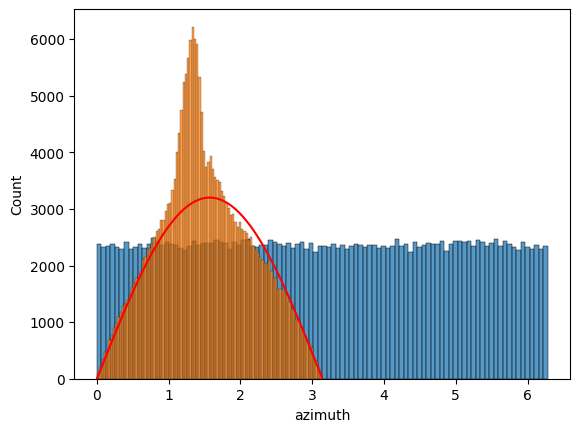

In [21]:
import matplotlib.pyplot as plt
#histogram of the azimuth truth angle
sns.histplot(truth['azimuth'], bins=100)
sns.histplot(truth['zenith'], bins=100)
plt.plot(np.linspace(0, 3.14, 100), np.sin(np.linspace(0, 3.14, 100))*3200, label='sin', c='r')
plt.show()

<Axes: xlabel='energy', ylabel='Count'>

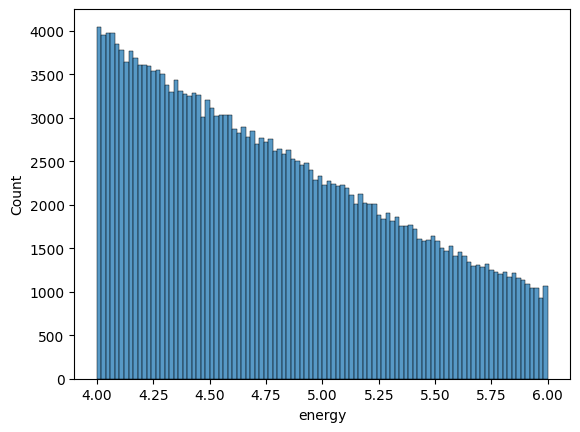

In [30]:
sns.histplot(np.log10(truth['energy']), bins=100)

In [27]:
#plot the azimuth and zenith angles in interactive 3d plot
import plotly.express as px
fig = px.scatter_3d(x=np.cos(truth['azimuth'])*np.sin(truth['zenith']), y=np.sin(truth['azimuth'])*np.sin(truth['zenith']), z=np.cos(truth['zenith']),
                    title='3D Scatter Plot of Azimuth and Zenith Angles with Energy')
fig.update_traces(marker=dict(size=0.2))
fig.update_layout(scene=dict(
                    xaxis_title='Azimuth (rad)',
                    yaxis_title='Zenith (rad)',
                    zaxis_title='Energy (GeV)'),
                    width=800, height=800)
fig.show()


In [14]:
for i in data.columns:
    if min(data[i]) == max(data[i]):
        print(i)

pmt_area
bad_dom_status
bright_dom_status


In [13]:
variables = vars[(vars != 'pmt_area') & (vars != 'bad_dom_status') & (vars != 'bright_dom_status') & (vars != 'event_no') & (vars != 'original_event_no')] 

#scatter plots
sns.pairplot(data[variables][:5000])

In [25]:
null_sum = 0
for i in range(1,22):
    data =  pd.read_parquet('../22011/1/PMTfied_'+str(i)+'.parquet')
    null_sum += data.isnull().sum()
    if (min(data['pmt_area']) != max(data['pmt_area'])) & (min(data['bad_dom_status']) != max(data['bad_dom_status'])) & (min(data['bright_dom_status']) != max(data['bright_dom_status'])):
        print('False ', i)

print('#nulls=', null_sum)


#nulls= event_no             0
original_event_no    0
dom_x                0
dom_y                0
dom_z                0
dom_x_rel            0
dom_y_rel            0
dom_z_rel            0
pmt_area             0
rde                  0
saturation_status    0
bad_dom_status       0
bright_dom_status    0
q1                   0
q2                   0
q3                   0
q4                   0
q5                   0
Q25                  0
Q75                  0
Qtotal               0
hlc1                 0
hlc2                 0
hlc3                 0
hlc4                 0
hlc5                 0
t1                   0
t2                   0
t3                   0
t4                   0
t5                   0
T10                  0
T50                  0
sigmaT               0
dtype: int64


In [17]:
print(variables)

Index(['dom_x', 'dom_y', 'dom_z', 'dom_x_rel', 'dom_y_rel', 'dom_z_rel', 'rde',
       'saturation_status', 'q1', 'q2', 'q3', 'q4', 'q5', 'Q25', 'Q75',
       'Qtotal', 'hlc1', 'hlc2', 'hlc3', 'hlc4', 'hlc5', 't1', 't2', 't3',
       't4', 't5', 'T10', 'T50', 'sigmaT'],
      dtype='object')


In [19]:
sum = 0
for i in range(1,11):
    data =  pd.read_parquet('../22011/truth_'+str(i)+'.parquet')
    sum += len(data)
print('Sum of events: ', sum)

Sum of events:  2174052


In [29]:
pip install -r ../IceCubeTransformer/requirements.txt

ERROR: Could not find a version that satisfies the requirement nvidia-cudnn-cu12==8.9.2.26 (from versions: 0.0.1.dev5, 8.9.4.25, 8.9.5.29, 8.9.6.50, 8.9.7.29, 9.0.0.312, 9.1.0.70, 9.1.1.17, 9.2.0.82, 9.2.1.18, 9.3.0.75, 9.4.0.58, 9.5.0.50, 9.5.1.17, 9.6.0.74, 9.7.0.66, 9.7.1.26, 9.8.0.87, 9.9.0.52, 9.10.0.56, 9.10.1.4)
ERROR: No matching distribution found for nvidia-cudnn-cu12==8.9.2.26
